# Analisis inicial dataset 

In [1]:
import pandas as pd
import numpy          as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from collections import Counter
import itertools

In [2]:
data = pd.read_csv("../../data/raw/train.csv")

In [3]:
data.head(5)

,id,label,statement,subject,speaker,speaker_job,state_info,party_affiliation
0,81f884c64a7,1,China is in the South China Sea and (building)...,"china,foreign-policy,military",donald-trump,President-Elect,New York,republican
1,30c2723a188,0,With the resources it takes to execute just ov...,health-care,chris-dodd,U.S. senator,Connecticut,democrat
2,6936b216e5d,0,The (Wisconsin) governor has proposed tax give...,"corporations,pundits,taxes,abc-news-week",donna-brazile,Political commentator,"Washington, D.C.",democrat
3,b5cd9195738,1,Says her representation of an ex-boyfriend who...,"candidates-biography,children,ethics,families,...",rebecca-bradley,NaN,NaN,none
4,84f8dac7737,0,At protests in Wisconsin against proposed coll...,"health-care,labor,state-budget",republican-party-wisconsin,NaN,Wisconsin,republican


In [4]:
data.shape

(8950, 8)

## Analisis de columnas

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   id                 8950 non-null   object
 1   label              8950 non-null   int64 
 2   statement          8950 non-null   object
 3   subject            8950 non-null   object
 4   speaker            8950 non-null   object
 5   speaker_job        6468 non-null   object
 6   state_info         7020 non-null   object
 7   party_affiliation  8950 non-null   object
dtypes: int64(1), object(7)
memory usage: 559.5+ KB


In [6]:
# Identificación de valores nulos
print("Valores nulos por columna:")
print(data.isnull().sum(), "\n")

Valores nulos por columna:
id                      0
label                   0
statement               0
subject                 0
speaker                 0
speaker_job          2482
state_info           1930
party_affiliation       0
dtype: int64 



In [7]:
# Mostrar los valores únicos de cada columna
print("Valores únicos por columna:")
for column in data.columns:
    print(f"Columna '{column}':")
    valores_unicos = data[column].unique()
    print(valores_unicos)
    print(f"Cantidad de valores únicos: {len(valores_unicos)}")
    print()


Valores únicos por columna:
Columna 'id':
['81f884c64a7' '30c2723a188' '6936b216e5d' ... '7c57fa8e81c' '2375e3cf4b7'
 '5ae9b14e6e5']
Cantidad de valores únicos: 8950

Columna 'label':
[1 0]
Cantidad de valores únicos: 2

Columna 'statement':
['China is in the South China Sea and (building)a military fortress the likes of which perhaps the world has not seen.'
 'With the resources it takes to execute just over three months of the Iraq war, we could fully fund the expansion of health care for needy children that Bush vetoed.'
 'The (Wisconsin) governor has proposed tax giveaways to corporations.'
 ...
 'The health insurance plan that (members of Congress) have is no different than any other federal employees in the United States government.'
 'No one in American history has moved from a June 16 announcement to a May 26 winning of a majority. Trumps achievement is remarkable.'
 'Says the Army is spending $7 million to sponsor a NASCAR team.']
Cantidad de valores únicos: 8939

Columna 'sub

In [8]:
# Rellenar los valores nulos con "non-define"
data['speaker_job'] = data['speaker_job'].fillna('non-define')
data['state_info'] = data['state_info'].fillna('non-define')

In [9]:
# Identificación de valores nulos
print("Valores nulos por columna:")
print(data.isnull().sum(), "\n")

Valores nulos por columna:
id                   0
label                0
statement            0
subject              0
speaker              0
speaker_job          0
state_info           0
party_affiliation    0
dtype: int64 



In [10]:
#  Comprobación de duplicados
print("Número de filas duplicadas:")
print(data.duplicated().sum(), "\n")

Número de filas duplicadas:
0 



### label

In [11]:
label_counts = data['label'].value_counts()
print(label_counts)

label
1    5795
0    3155
Name: count, dtype: int64


Fake "1" : 5795
Not Fake "0": 3155
Fake: 64.7486033519553%


/var/folders/_f/tnvd8_ms5rb8t4jqz9y92c2w0000gn/T/ipykernel_8291/2314642966.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(['Not Fake', 'Fake'])


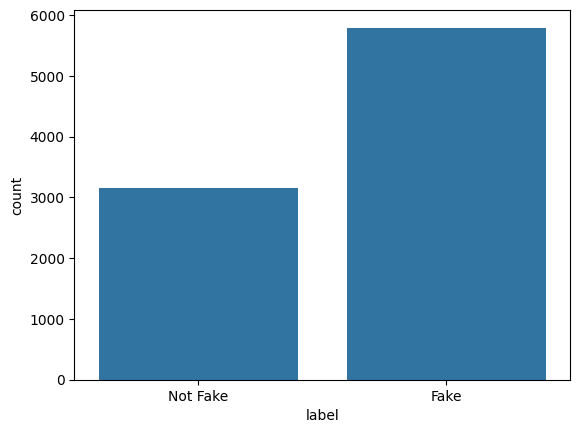

In [12]:
# Contar las ocurrencias de 0 y 1 en la columna 'label'
count = data['label'].value_counts()

print('Fake "1" :', count[1])
print('Not Fake "0":', count[0])

# Calcular el porcentaje de 'Fake' (1)
print(f'Fake: {count[1] / (count[0] + count[1]) * 100}%')

# Graficar las ocurrencias de 1's y 0's
g = sns.countplot(x=data['label'])
g.set_xticklabels(['Not Fake', 'Fake'])
plt.show()


### subject

In [13]:
pd.set_option('display.max_rows', None)
subject_counts = data['subject'].value_counts()
print(subject_counts)

subject
health-care                                                                                                                                                                                                    341
taxes                                                                                                                                                                                                          244
elections                                                                                                                                                                                                      225
immigration                                                                                                                                                                                                    224
education                                                                                                                                           

Viene escritos todos los temas que se hablan en la statemen, por ejemplo: federal-budget,medicare (unico subject) 
Creo que lo mejor es sacar los token se todas las estatement y desde ahi vercomo podemos preprocesar


### speaker

In [14]:
speaker_counts = data['speaker'].value_counts().sort_index()
print(speaker_counts)

speaker
13th-district-gop-slate                                 1
18-percent-american-public                              2
60-plus-association                                     2
AARP                                                    1
Arizona-Citizens-Defense-League                         2
Ballesteros                                             1
Coast-Guard                                             1
GaGOP                                                   4
Jack_Graham                                             1
Local-799-international-assoc-fire-fighters             1
accountability-government                               1
accountability-project                                  1
aclu-georgia-foundation                                 1
aclu-north-carolina                                     1
actionaid-k                                             2
adam-hasner                                             9
adam-kinzinger                                          1
adam-p

In [15]:
count = data.speaker.value_counts().to_frame(name='count')
percentage = (data[data.label==1].speaker.value_counts() / data.speaker.value_counts()).to_frame(name='percentage')

speaker_info = pd.concat([count,percentage], axis=1)

print('Speakers con mas nuemero de statements y porcentaje de cuales de ellas han sido falsas')
print(speaker_info.sort_values(by='count',ascending=False).head(10))
print()
speaker_by_percentage = speaker_info.sort_values(by='percentage',ascending=False)
print('Speaker ordenados por mayor porcentaje de fake statements')
print(speaker_by_percentage[speaker_by_percentage['count'] > 10])
print()

Speakers con mas nuemero de statements y porcentaje de cuales de ellas han sido falsas
                 count  percentage
speaker                           
barack-obama       435    0.535632
donald-trump       247    0.834008
hillary-clinton    204    0.480392
mitt-romney        142    0.718310
john-mccain        139    0.589928
chain-email        128    0.968750
scott-walker       123    0.650407
rick-perry         117    0.717949
rick-scott         105    0.647619
marco-rubio         99    0.676768

Speaker ordenados por mayor porcentaje de fake statements
                                             count  percentage
speaker                                                       
viral-image                                     18    1.000000
americans-prosperity                            15    1.000000
chain-email                                    128    0.968750
rush-limbaugh                                   25    0.960000
national-republican-senatorial-committee        24    0.

### speaker_job

In [16]:
speaker_job_counts = data['speaker_job'].value_counts()
print(speaker_job_counts)

speaker_job
non-define                                                                                              2482
President                                                                                                438
U.S. Senator                                                                                             391
Governor                                                                                                 335
President-Elect                                                                                          247
U.S. senator                                                                                             236
Presidential candidate                                                                                   215
U.S. Representative                                                                                      149
Former governor                                                                                          142
Senator

In [17]:
data.speaker_job = data.speaker_job.apply(lambda x: x.lower() if type(x)==str else x)
count = data.speaker_job.value_counts().to_frame(name='count')
percentage = (data[data.label==1].speaker_job.value_counts() / data.speaker_job.value_counts()).to_frame(name='percentage')

speaker_job_info = pd.concat([count,percentage], axis=1)
print('Speakers_jobs con mas nuemero de statements y porcentaje de cuales de ellas han sido falsas')
print(speaker_job_info.sort_values(by='count',ascending=False).head(10))
print()
speaker_job_by_percentage = speaker_job_info.sort_values(by='percentage',ascending=False)

print('Speaker_jobs ordenados por mayor porcentaje de fake statements')
print(speaker_job_by_percentage[speaker_job_by_percentage['count'] > 10])
print()

Speakers_jobs con mas nuemero de statements y porcentaje de cuales de ellas han sido falsas
                        count  percentage
speaker_job                              
non-define               2482    0.697421
u.s. senator              627    0.548644
president                 438    0.536530
governor                  368    0.663043
president-elect           247    0.834008
u.s. representative       230    0.626087
presidential candidate    216    0.495370
state senator             183    0.568306
state representative      153    0.614379
former governor           143    0.720280

Speaker_jobs ordenados por mayor porcentaje de fake statements
                                                    count  percentage
speaker_job                                                          
radio host                                             26    0.961538
advocacy group                                         14    0.928571
milwaukee county sheriff                               11   

### state_info

In [18]:
state_info_counts = data['state_info'].value_counts()
print(state_info_counts.sort_index())

state_info
Alabama                                                10
Alaska                                                 50
Arizona                                               160
Arkansas                                               77
Atlanta                                                 1
California                                            121
California                                              1
China                                                   1
Colorado                                               22
Colorado                                                4
Connecticut                                            21
Delaware                                               61
District of Columbia                                   10
Florida                                               853
Florida                                                 4
Georgia                                               381
Georgia                                                 3
Geo

Hay cosas mal escritas: 
1) "Rhode Island" y "Rhode island"
2) "Virgina" a "Virginia"
3) "Tennesse" a "Tennessee"
4) Variaciones de Washingtn DC

La gran mayoria son estados de estados unidos.
Hay un valor que es estados unidos de por si, que no epsecifican estados.
Foreigh =  Russia (1), Qatar (1) y China(1)

Valores raros:
Virginia director, Coalition to Stop Gun Violence: 1


In [19]:
data['state_info'] = data['state_info'].str.replace(",", "", regex=False)
data['state_info'] = data['state_info'].str.replace(".", "", regex=False)

state_info_counts = data['state_info'].value_counts()
print(state_info_counts.sort_index())

state_info
Alabama                                               10
Alaska                                                50
Arizona                                              160
Arkansas                                              77
Atlanta                                                1
California                                           121
California                                             1
China                                                  1
Colorado                                              22
Colorado                                               4
Connecticut                                           21
Delaware                                              61
District of Columbia                                  10
Florida                                              853
Florida                                                4
Georgia                                              381
Georgia                                                3
Georgia             

In [20]:
corrections = {
    'virgina': 'virginia',
    'tennesse': 'tennessee',
    'district of columbia': 'washington dc',
    'washington state': 'washington',
    'the united states': 'united states',
    'unknown': 'non-define'
}


In [21]:
virginia_director = data[data['state_info'].str.contains("Virginia director")]
virginia_director


,id,label,statement,subject,speaker,speaker_job,state_info,party_affiliation
6013,e1b888de79e,1,In states that have private-sale background ch...,"crime,guns,states,women",lori-haas,virginia,Virginia director Coalition to Stop Gun Violence,activist


Estan invertidos los valores de speaker_job y state_info

In [22]:
# Filtrar la fila con el ID específico
row = data[data['id'] == 'e1b888de79e']

# Intercambiar los valores de 'speaker_job' y 'state_info' para esa fila
data.loc[data['id'] == 'e1b888de79e', ['speaker_job', 'state_info']] = row[['state_info', 'speaker_job']].values


In [23]:
virginia_director = data[data['speaker_job'].str.contains("Virginia director")]
virginia_director

,id,label,statement,subject,speaker,speaker_job,state_info,party_affiliation
6013,e1b888de79e,1,In states that have private-sale background ch...,"crime,guns,states,women",lori-haas,Virginia director Coalition to Stop Gun Violence,virginia,activist


Cambiado con exito

In [24]:
data["state_info"] = data["state_info"].astype(str).str.strip().str.lower()
data['state_info'] = data['state_info'].replace(corrections)

state_info_counts = data['state_info'].value_counts()
print(state_info_counts.sort_index())


state_info
alabama             10
alaska              50
arizona            160
arkansas            77
atlanta              1
california         122
china                1
colorado            26
connecticut         21
delaware            61
florida            857
georgia            385
hawaii               1
idaho                2
illinois           489
indiana             38
iowa                13
kansas              13
kentucky            72
louisiana           25
maryland            60
massachusetts      172
michigan            21
minnesota           54
mississippi          2
missouri            32
montana              1
nebraska             3
nevada              40
new hampshire       80
new jersey         209
new mexico          24
new york           580
non-define        1932
north carolina      51
north dakota         3
ohio               410
oklahoma            10
oregon             222
pennsylvania        79
qatar                1
rhode island       319
russia               1


In [25]:
data['state_info'] = data['state_info'].str.strip().str.replace(" ", "_", regex=False)
state_info_counts = data['state_info'].value_counts()
print(state_info_counts.sort_index())


state_info
alabama             10
alaska              50
arizona            160
arkansas            77
atlanta              1
california         122
china                1
colorado            26
connecticut         21
delaware            61
florida            857
georgia            385
hawaii               1
idaho                2
illinois           489
indiana             38
iowa                13
kansas              13
kentucky            72
louisiana           25
maryland            60
massachusetts      172
michigan            21
minnesota           54
mississippi          2
missouri            32
montana              1
nebraska             3
nevada              40
new_hampshire       80
new_jersey         209
new_mexico          24
new_york           580
non-define        1932
north_carolina      51
north_dakota         3
ohio               410
oklahoma            10
oregon             222
pennsylvania        79
qatar                1
rhode_island       319
russia               1


In [26]:
count = data.state_info.value_counts().to_frame(name='count')
percentage = (data[data.label==1].state_info.value_counts() / data.state_info.value_counts()).to_frame(name='percentage')

state_info = pd.concat([count,percentage], axis=1)

print('State con mas nuemero de statements y porcentaje de cuales de ellas han sido falsas')
print(state_info.sort_values(by='count',ascending=False).head(10))
print()
state_by_percentage = state_info.sort_values(by='percentage',ascending=False)
print('State ordenados por mayor porcentaje de fake statements')
print(state_by_percentage[state_by_percentage['count'] > 10].head(20))
print()

State con mas nuemero de statements y porcentaje de cuales de ellas han sido falsas
              count  percentage
state_info                     
non-define     1932    0.717909
texas           879    0.654152
florida         857    0.616103
wisconsin       649    0.704160
new_york        580    0.674138
illinois        489    0.554192
ohio            410    0.517073
georgia         385    0.607792
virginia        372    0.618280
rhode_island    319    0.614420

State ordenados por mayor porcentaje de fake statements
                count  percentage
state_info                       
iowa               13    0.846154
indiana            38    0.815789
pennsylvania       79    0.784810
minnesota          54    0.777778
alaska             50    0.760000
utah               19    0.736842
colorado           26    0.730769
non-define       1932    0.717909
wisconsin         649    0.704160
kansas             13    0.692308
massachusetts     172    0.691860
south_carolina     25    0.680000

### party_affiliation

In [27]:
party_counts = data['party_affiliation'].value_counts()
print(party_counts)

party_affiliation
republican                      3947
democrat                        2898
none                            1531
organization                     197
independent                      130
newsmaker                         41
journalist                        37
libertarian                       34
columnist                         32
activist                          30
talk-show-host                    23
state-official                    14
tea-party-member                   8
business-leader                    8
labor-leader                       7
green                              3
education-official                 2
constitution-party                 2
Moderate                           1
county-commissioner                1
liberal-party-canada               1
ocean-state-tea-party-action       1
government-body                    1
democratic-farmer-labor            1
Name: count, dtype: int64


Republican - uno de los dos partidos principales en los EE. UU.  Los republicanos generalmente favorecen políticas que promueven el libre mercado, el control del gasto público y una postura más rígida en temas de seguridad y justicia social.
Democrat  - otro de los principales partidos políticos en los EE. UU. Los demócratas apoyan el gobierno activo en la regulación del mercado, la implementación de políticas sociales y la protección de los derechos civiles.
None - Este perfil hace referencia a personas o entidades que no se identifican con un partido político específico. Pueden ser apolíticos o simplemente no alinearse con ninguna ideología predominante.
Organization - Se refiere a grupos u organizaciones que no son partidos políticos, pero que tienen una influencia significativa en la política, como ONGs.
Independent - Los independientes son personas que no están afiliadas a ningún partido político. 
Newsmaker -  Los newsmakers son influyentes en la política debido a su capacidad para generar atención mediática y moldear la opinión pública.
Journalist - Este perfil se refiere a los periodistas, quienes informan sobre eventos y desarrollos en el ámbito político, social y económico.
Libertarian - Los libertarios abogan por una política de mínimo gobierno y máxima libertad individual, promoviendo el libre mercado y la protección de los derechos personales. Los libertarios suelen alinearse con el Partido Libertario o adoptar una postura independiente. - Independent
Columnist - Los columnistas son escritores que expresan opiniones y análisis sobre temas políticos y sociales. - Independent
Activist - Pueden estar afiliados a partidos políticos, pero a menudo son más conocidos por su militancia. - Independent
Talk-show Host - Los presentadores de talk shows - Media
State Official - Los funcionarios estatales son individuos que ocupan cargos públicos en los gobiernos estatales. 
Tea Party Member - Los miembros del Tea Party son individuos que apoyan este movimiento político de ideología conservadora dentro del Partido Republicano. - Republican
Business Leader - e refiere a personas influyentes en el mundo de los negocios, como ejecutivos de grandes empresas. - Organization
Labor Leader - Los líderes sindicales suelen estar alineados con el Partido Demócrata en los EE. UU., y su enfoque está centrado en la justicia social y los derechos laborales. - Democrata
Green - El Partido Verde aboga por políticas ambientales, la lucha contra el cambio climático y la justicia social. Independiente
Constitution Party -  El Constitution Party es un partido político conservador en EE. UU. que aboga por una estricta interpretación de la Constitución y promueve el federalismo.
Education Official - s funcionarios de educación son responsables de implementar políticas educativas y su ideología influye en cómo se gestionan los sistemas educativos.
Moderate  - Un moderado es una persona que no se identifica con una ideología política extrema, sino que busca un enfoque equilibrado entre los diferentes espectros políticos. 
County Commissioner - Un comisionado de condado es un funcionario local que administra los asuntos del gobierno del condado. - State Official
Liberal Party Canada - El Partido Liberal de Canadá es un partido político progresista que promueve políticas sociales, económicas y ambientales. - Liberirial 
Ocean State Tea Party Action -  Se refiere a un grupo de activismo político en Rhode Island relacionado con el movimiento Tea Party. - Tea PArty - Republican
Government Body - Hace referencia a un órgano o institución del gobierno que no se alinea con un partido político específico.
Democratic-Farmer-Labor - Este es un partido político que fue precursor del Partido Demócrata moderno - Democrata

Vamos a unificar algunos tipos de esta columan en una nueva columna

In [28]:
corrections = {
    'democratic-farmer-labor': 'democrat',
    'ocean-state-tea-party-action': 'republican',
    'liberal-party-canada': 'libertarian',
    'tea-party-member': 'republican',
    'labor-leader': 'democrat',
    'green': 'independent',
    'county-commissioner': 'state-official',
    'education-official': 'state-official',
    'business-leader': 'organization',
    'government-body': 'state-official',
    'Moderate': 'independent',
    'constitution-party': 'independent'
}

In [29]:
data['party_affiliation_uni'] = data['party_affiliation'].replace(corrections)


In [30]:
party_counts = data['party_affiliation_uni'].value_counts()
print(party_counts)

party_affiliation_uni
republican        3956
democrat          2906
none              1531
organization       205
independent        136
newsmaker           41
journalist          37
libertarian         35
columnist           32
activist            30
talk-show-host      23
state-official      18
Name: count, dtype: int64


In [31]:
category_mapping = {
    'republican': 'political-affiliation',
    'democrat': 'political-affiliation',
    'independent': 'political-affiliation',
    'libertarian': 'political-affiliation',
    'none': 'other-political-groups',
    'organization': 'other-political-groups',
    'activist': 'other-political-groups',
    'newsmaker': 'media-and-communication',
    'journalist': 'media-and-communication',
    'columnist': 'media-and-communication',
    'talk-show-host': 'media-and-communication',
    'state-official': 'government-officials-and-authorities'
}

In [32]:
data['party_affiliation_category_map'] = data['party_affiliation_uni'].replace(category_mapping)
party_counts = data['party_affiliation_category_map'].value_counts()
print(party_counts)

party_affiliation_category_map
political-affiliation                   7033
other-political-groups                  1766
media-and-communication                  133
government-officials-and-authorities      18
Name: count, dtype: int64


In [33]:
count = data.party_affiliation.value_counts().to_frame(name='count')
percentage = (data[data.label==1].party_affiliation.value_counts() / data.party_affiliation.value_counts()).to_frame(name='percentage')

party_affiliation_info = pd.concat([count,percentage], axis=1)

print('State con mas nuemero de statements y porcentaje de cuales de ellas han sido falsas')
print(party_affiliation_info.sort_values(by='count',ascending=False).head(10))
print()
party_affiliation_by_percentage = party_affiliation_info.sort_values(by='percentage',ascending=False)
print('State ordenados por mayor porcentaje de fake statements')
print(party_affiliation_by_percentage[party_affiliation_by_percentage['count'] > 10].head(20))
print()

State con mas nuemero de statements y porcentaje de cuales de ellas han sido falsas
                   count  percentage
party_affiliation                   
republican          3947    0.695212
democrat            2898    0.562112
none                1531    0.693664
organization         197    0.812183
independent          130    0.446154
newsmaker             41    0.536585
journalist            37    0.513514
libertarian           34    0.617647
columnist             32    0.593750
activist              30    0.566667

State ordenados por mayor porcentaje de fake statements
                   count  percentage
party_affiliation                   
organization         197    0.812183
talk-show-host        23    0.739130
republican          3947    0.695212
none                1531    0.693664
libertarian           34    0.617647
columnist             32    0.593750
activist              30    0.566667
democrat            2898    0.562112
newsmaker             41    0.536585
journali

In [58]:
data.to_csv('data_limpieza_v2.csv', index=False)


In [52]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 10 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   id                              8950 non-null   object
 1   label                           8950 non-null   int64 
 2   statement                       8950 non-null   object
 3   subject                         8950 non-null   object
 4   speaker                         8950 non-null   object
 5   speaker_job                     8950 non-null   object
 6   state_info                      8950 non-null   object
 7   party_affiliation               8950 non-null   object
 8   party_affiliation_uni           8950 non-null   object
 9   party_affiliation_category_map  8950 non-null   object
dtypes: int64(1), object(9)
memory usage: 699.3+ KB


# Test

In [37]:
test = pd.read_csv("../../data/raw/test_nolabel.csv")
test.shape

(3836, 7)

In [38]:
print("Valores nulos por columna:")
print(test.isnull().sum(), "\n")

Valores nulos por columna:
id                      0
statement               0
subject                 0
speaker                 0
speaker_job          1082
state_info            818
party_affiliation       0
dtype: int64 



In [39]:
# Rellenar los valores nulos con "non-define"
test['speaker_job'] = test['speaker_job'].fillna('non-define')
test['state_info'] = test['state_info'].fillna('non-define')

In [40]:
corrections = {
    'virgina': 'virginia',
    'tennesse': 'tennessee',
    'district of columbia': 'washington dc',
    'washington state': 'washington',
    'the united states': 'united states',
    'unknown': 'non-define'
}

data["state_info"] = data["state_info"].astype(str).str.strip().str.lower()
data['state_info'] = data['state_info'].replace(corrections)

state_info_counts = data['state_info'].value_counts()
print(state_info_counts.sort_index())

state_info
alabama             10
alaska              50
arizona            160
arkansas            77
atlanta              1
california         122
china                1
colorado            26
connecticut         21
delaware            61
florida            857
georgia            385
hawaii               1
idaho                2
illinois           489
indiana             38
iowa                13
kansas              13
kentucky            72
louisiana           25
maryland            60
massachusetts      172
michigan            21
minnesota           54
mississippi          2
missouri            32
montana              1
nebraska             3
nevada              40
new_hampshire       80
new_jersey         209
new_mexico          24
new_york           580
non-define        1932
north_carolina      51
north_dakota         3
ohio               410
oklahoma            10
oregon             222
pennsylvania        79
qatar                1
rhode_island       319
russia               1


In [41]:
corrections = {
    'democratic-farmer-labor': 'democrat',
    'ocean-state-tea-party-action': 'republican',
    'liberal-party-canada': 'libertarian',
    'tea-party-member': 'republican',
    'labor-leader': 'democrat',
    'green': 'independent',
    'county-commissioner': 'state-official',
    'education-official': 'state-official',
    'business-leader': 'organization',
    'government-body': 'state-official',
    'Moderate': 'independent',
    'constitution-party': 'independent'
}

In [42]:
party_counts = test['party_affiliation'].value_counts()
print(party_counts)

party_affiliation
republican             1716
democrat               1238
none                    650
organization             67
independent              50
newsmaker                23
libertarian              17
activist                 15
columnist                12
journalist               12
state-official           10
talk-show-host            9
labor-leader              8
business-leader           3
tea-party-member          2
education-official        1
county-commissioner       1
constitution-party        1
government-body           1
Name: count, dtype: int64


In [43]:
corrections = {
    'democratic-farmer-labor': 'democrat',
    'ocean-state-tea-party-action': 'republican',
    'liberal-party-canada': 'libertarian',
    'tea-party-member': 'republican',
    'labor-leader': 'democrat',
    'green': 'independent',
    'county-commissioner': 'state-official',
    'education-official': 'state-official',
    'business-leader': 'organization',
    'government-body': 'state-official',
    'Moderate': 'independent',
    'constitution-party': 'independent'
}

In [44]:
test['party_affiliation_uni'] = test['party_affiliation'].replace(corrections)

In [45]:
test.info

<bound method DataFrame.info of                id                                          statement  \
0     dc32e5ffa8b  Five members of [the Common Cause Georgia] boa...   
1     aa49bb41cab  Theres no negative advertising in my campaign ...   
2     dddc8d12ac1  Leticia Van de Putte voted to give illegal imm...   
3     bcfe8f51667  Fiorinas plan would mean slashing Social Secur...   
4     eedbbaff5ab  By the end of his first term, President Obama ...   
5     023a79000dd  The U.S. Senate has one manufacturer thatd be me.   
6     7b62ade4dc8  If you're over 65 years old in America today, ...   
7     1a63692769b  Common Core expects English teachers to spend ...   
8     c345452998b  Because of the federal health care law, 300,00...   
9     77edc1d3182  House Speaker Dean Cannon says that freshmen l...   
10    583b66f3355  Barack Obama said "people making less than $25...   
11    2467bc4feb7  Royalties foroil and other energy sources are ...   
12    71c4aa416aa  Voting in the

In [46]:
party_counts = test['party_affiliation_uni'].value_counts()
print(party_counts)

party_affiliation_uni
republican        1718
democrat          1246
none               650
organization        70
independent         51
newsmaker           23
libertarian         17
activist            15
state-official      13
columnist           12
journalist          12
talk-show-host       9
Name: count, dtype: int64


In [47]:
category_mapping = {
    'republican': 'political-affiliation',
    'democrat': 'political-affiliation',
    'independent': 'political-affiliation',
    'libertarian': 'political-affiliation',
    'none': 'other-political-groups',
    'organization': 'other-political-groups',
    'activist': 'other-political-groups',
    'newsmaker': 'media-and-communication',
    'journalist': 'media-and-communication',
    'columnist': 'media-and-communication',
    'talk-show-host': 'media-and-communication',
    'state-official': 'government-officials-and-authorities'
}

In [48]:
test['party_affiliation_category_map'] = test['party_affiliation_uni'].replace(category_mapping)
party_counts = test['party_affiliation_category_map'].value_counts()
print(party_counts)

party_affiliation_category_map
political-affiliation                   3032
other-political-groups                   735
media-and-communication                   56
government-officials-and-authorities      13
Name: count, dtype: int64


In [49]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3836 entries, 0 to 3835
Data columns (total 9 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   id                              3836 non-null   object
 1   statement                       3836 non-null   object
 2   subject                         3836 non-null   object
 3   speaker                         3836 non-null   object
 4   speaker_job                     3836 non-null   object
 5   state_info                      3836 non-null   object
 6   party_affiliation               3836 non-null   object
 7   party_affiliation_uni           3836 non-null   object
 8   party_affiliation_category_map  3836 non-null   object
dtypes: object(9)
memory usage: 269.8+ KB


In [57]:
test.to_csv('test_limpieza_v2.csv', index=False)

In [56]:
data

,id,label,statement,subject,speaker,speaker_job,state_info,party_affiliation,party_affiliation_uni,party_affiliation_category_map
0,81f884c64a7,1,China is in the South China Sea and (building)...,"china,foreign-policy,military",donald-trump,president-elect,new_york,republican,republican,political-affiliation
1,30c2723a188,0,With the resources it takes to execute just ov...,health-care,chris-dodd,u.s. senator,connecticut,democrat,democrat,political-affiliation
2,6936b216e5d,0,The (Wisconsin) governor has proposed tax give...,"corporations,pundits,taxes,abc-news-week",donna-brazile,political commentator,washington_dc,democrat,democrat,political-affiliation
3,b5cd9195738,1,Says her representation of an ex-boyfriend who...,"candidates-biography,children,ethics,families,...",rebecca-bradley,non-define,non-define,none,none,other-political-groups
4,84f8dac7737,0,At protests in Wisconsin against proposed coll...,"health-care,labor,state-budget",republican-party-wisconsin,non-define,wisconsin,republican,republican,political-affiliation
5,d22b78a1570,1,Ron Klein sponsored an amendment that specific...,candidates-biography,we-love-usa-pac,non-define,non-define,none,none,other-political-groups
6,df58c465da8,0,Rhode Islands legislature is the strongest in ...,"legal-issues,state-budget,states",lincoln-chafee,non-define,rhode_island,democrat,democrat,political-affiliation
7,62d339fd0aa,1,Because of Barack Obama the mission in Iraq en...,iraq,barack-obama,president,illinois,democrat,democrat,political-affiliation
8,32c82086791,0,"In the last 15 years, weve witnessed a dramati...",immigration,aclu-georgia-foundation,non-define,non-define,none,none,other-political-groups
9,f3aadc05597,0,The top 1/10th of 1 percent today in America o...,"economy,income,retirement,social-security,wealth",bernie-s,u.s. senator,vermont,independent,independent,political-affiliation
